In [1]:
!pip install xgboost
!pip install seaborn
!pip install matplotlib

DEPRECATION: Python 2.7 will reach the end of its life on January 1st, 2020. Please upgrade your Python as Python 2.7 won't be maintained after that date. A future version of pip will drop support for Python 2.7. More details about Python 2 support in pip, can be found at https://pip.pypa.io/en/latest/development/release-process/#python-2-support


DEPRECATION: Python 2.7 will reach the end of its life on January 1st, 2020. Please upgrade your Python as Python 2.7 won't be maintained after that date. A future version of pip will drop support for Python 2.7. More details about Python 2 support in pip, can be found at https://pip.pypa.io/en/latest/development/release-process/#python-2-support


DEPRECATION: Python 2.7 will reach the end of its life on January 1st, 2020. Please upgrade your Python as Python 2.7 won't be maintained after that date. A future version of pip will drop support for Python 2.7. More details about Python 2 support in pip, can be found at https://pip.pypa.io/en/latest/development/release-process/#python-2-support


In [7]:
#### Imports para entrenamiento, predicción y evaluación del modelo ####
#### NO QUITAR ####
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix
#### Código Agregado ####
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [8]:
### Loading Data
data = pd.read_csv('C:/Users/cloudadmin/Documents/dataset/norech4w_20190908_abt_data.txt',sep='|')
tag = pd.read_csv('C:/Users/cloudadmin/Documents/dataset/norech4w_20190908_abt_tag.txt',sep='|')

## Preparamos el tag y el dataset completo

In [12]:
data.head()

,SUSCRIBER_KEY,FECHA_CORTE,LAT_PROV_BTS,LON_PROV_BTS,LAT_CITY_BTS,LON_CITY_BTS,VALUE_SEGMENT,SEGMENTATION,MICROSEGMENTATION,SOURCE,...,PACK_DATA_EXP_W3,PACK_DATA_EXP_W4,PACK_DATA_EXP_W5,PACK_DATA_EXP_W6,PACK_DATA_EXP_W7,PACK_DATA_EXP_W8,PACK_DATA_EXP_W9,PACK_DATA_EXP_W10,PACK_DATA_EXP_W11,PACK_DATA_EXP_W12
0,E_67773005_20190427,08-SEP-19,9.41650,-82.52070,-82.52000,9.43000,2 - GOLD,3-DO,VD3,NEW,...,11,7,13,11,9,11,12,9,9,0
1,E_65364767_20150701,08-SEP-19,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,9,11,11,15,9,13,15,14,13
2,E_67094312_20150701,08-SEP-19,8.79528,-80.14711,-79.65000,8.95000,3 - SILVER,5-PV,PV1,NEW,...,0,0,0,0,0,0,0,0,0,0
3,E_66513730_20150701,08-SEP-19,9.08320,-79.59240,-79.47068,9.05032,2 - GOLD,3-DO,DO4,NEW,...,11,12,8,9,10,11,13,8,10,10
4,E_67337458_20181130,08-SEP-19,9.08320,-79.59240,-79.51973,8.99360,3 - SILVER,7-LOW,OH1,NEW,...,0,0,0,4,11,0,0,0,0,0


In [13]:
tag.head()

,SUSCRIBER_KEY,PREP_RECH_AMT_W_0,PREP_RECH_AMT_W_1,PREP_RECH_AMT_W_2,PREP_RECH_AMT_W_3,PREP_RECH_Q_EVT_W_0,PREP_RECH_Q_EVT_W_1,PREP_RECH_Q_EVT_W_2,PREP_RECH_Q_EVT_W_3
0,CW_DPRE_67759547_20150701,6.0,7.5,6.0,5.0,4,5,3,1
1,CW_DPRE_66948838_20171126,3.0,0.0,1.5,6.3,1,0,1,4
2,CW_DPRE_68858157_20180607,0.0,3.0,0.0,0.0,0,1,0,0
3,CW_DPRE_65464761_20181014,0.0,4.5,0.0,0.0,0,2,0,0
4,CW_DPRE_67448216_20150701,5.0,0.0,3.0,0.0,1,0,1,0


In [15]:
#como la primer parte de suscriber key no nos importa, pq es igual, la recortamos
tag['SUSCRIBER_KEY'] = tag['SUSCRIBER_KEY'].str[6:]

In [16]:
tag.head()

,SUSCRIBER_KEY,PREP_RECH_AMT_W_0,PREP_RECH_AMT_W_1,PREP_RECH_AMT_W_2,PREP_RECH_AMT_W_3,PREP_RECH_Q_EVT_W_0,PREP_RECH_Q_EVT_W_1,PREP_RECH_Q_EVT_W_2,PREP_RECH_Q_EVT_W_3
0,9547_20150701,6.0,7.5,6.0,5.0,4,5,3,1
1,8838_20171126,3.0,0.0,1.5,6.3,1,0,1,4
2,8157_20180607,0.0,3.0,0.0,0.0,0,1,0,0
3,4761_20181014,0.0,4.5,0.0,0.0,0,2,0,0
4,8216_20150701,5.0,0.0,3.0,0.0,1,0,1,0


In [20]:
#borramos todas las columnas que contengan amt pq sabemos que son columnas que no se usan
tag.drop(columns=[x for x in tag.columns if 'AMT' in x],inplace=True)
tag.head()


,SUSCRIBER_KEY,PREP_RECH_Q_EVT_W_0,PREP_RECH_Q_EVT_W_1,PREP_RECH_Q_EVT_W_2,PREP_RECH_Q_EVT_W_3
0,9547_20150701,4,5,3,1
1,8838_20171126,1,0,1,4
2,8157_20180607,0,1,0,0
3,4761_20181014,0,2,0,0
4,8216_20150701,1,0,1,0


In [22]:
#creamos una nueva columna total, que suma los  valores de las recargas acumuladas por semana
tag['Total'] = tag[tag.columns[1:]].sum(axis=1)
tag['Total']

0         26
1         12
2          2
3          4
4          4
5         14
6          4
7          0
8          2
9          8
10        10
11         6
12         6
13         2
14         0
15         0
16         4
17        12
18         4
19        10
20         0
21         8
22         2
23         8
24         0
25         0
26         8
27        10
28         0
29        10
          ..
967310     6
967311     8
967312     4
967313     4
967314     2
967315     6
967316     6
967317     2
967318     4
967319     8
967320     0
967321     0
967322    10
967323     0
967324    10
967325     8
967326     8
967327     4
967328    18
967329     2
967330     6
967331     0
967332     0
967333     8
967334     4
967335     0
967336    16
967337     8
967338    10
967339     2
Name: Total, Length: 967340, dtype: int64

In [23]:
#entonces ahora borramos todas las columnas que contenga EVT, que son la cantidad de recargas acumuladas por semana, 
#al tener su valor acumulado ya estas columnas no nos sirven
tag.drop(columns=[x for x in tag.columns if 'EVT' in x],inplace=True)

In [24]:
tag.head()

,SUSCRIBER_KEY,Total
0,9547_20150701,26
1,8838_20171126,12
2,8157_20180607,2
3,4761_20181014,4
4,8216_20150701,4


In [25]:
#vamos a guardar en total, false para todos aquellos cuya sumatoria sea 0, y true para los que tengan total mayor a 1 
# add comment
tag['Total']=tag['Total']<1
tag['Total']

0         False
1         False
2         False
3         False
4         False
5         False
6         False
7          True
8         False
9         False
10        False
11        False
12        False
13        False
14         True
15         True
16        False
17        False
18        False
19        False
20         True
21        False
22        False
23        False
24         True
25         True
26        False
27        False
28         True
29        False
          ...  
967310    False
967311    False
967312    False
967313    False
967314    False
967315    False
967316    False
967317    False
967318    False
967319    False
967320     True
967321     True
967322    False
967323     True
967324    False
967325    False
967326    False
967327    False
967328    False
967329    False
967330    False
967331     True
967332     True
967333    False
967334    False
967335     True
967336    False
967337    False
967338    False
967339    False
Name: Total, Length: 967

In [26]:
#renombramos la columna total por target
tag.rename(columns={'Total':'Target'},inplace=True)
tag.head()

,SUSCRIBER_KEY,Target
0,9547_20150701,False
1,8838_20171126,False
2,8157_20180607,False
3,4761_20181014,False
4,8216_20150701,False


In [27]:
#en vez de tenerlo como true o false es mas correcto manejarlo como 0s y 1s 
tag['Target'] = tag['Target'].astype(int)
tag.head()

,SUSCRIBER_KEY,Target
0,9547_20150701,0
1,8838_20171126,0
2,8157_20180607,0
3,4761_20181014,0
4,8216_20150701,0


In [30]:
data.head()

,SUSCRIBER_KEY,FECHA_CORTE,LAT_PROV_BTS,LON_PROV_BTS,LAT_CITY_BTS,LON_CITY_BTS,VALUE_SEGMENT,SEGMENTATION,MICROSEGMENTATION,SOURCE,...,PACK_DATA_EXP_W3,PACK_DATA_EXP_W4,PACK_DATA_EXP_W5,PACK_DATA_EXP_W6,PACK_DATA_EXP_W7,PACK_DATA_EXP_W8,PACK_DATA_EXP_W9,PACK_DATA_EXP_W10,PACK_DATA_EXP_W11,PACK_DATA_EXP_W12
0,E_67773005_20190427,08-SEP-19,9.41650,-82.52070,-82.52000,9.43000,2 - GOLD,3-DO,VD3,NEW,...,11,7,13,11,9,11,12,9,9,0
1,E_65364767_20150701,08-SEP-19,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,9,11,11,15,9,13,15,14,13
2,E_67094312_20150701,08-SEP-19,8.79528,-80.14711,-79.65000,8.95000,3 - SILVER,5-PV,PV1,NEW,...,0,0,0,0,0,0,0,0,0,0
3,E_66513730_20150701,08-SEP-19,9.08320,-79.59240,-79.47068,9.05032,2 - GOLD,3-DO,DO4,NEW,...,11,12,8,9,10,11,13,8,10,10
4,E_67337458_20181130,08-SEP-19,9.08320,-79.59240,-79.51973,8.99360,3 - SILVER,7-LOW,OH1,NEW,...,0,0,0,4,11,0,0,0,0,0


In [31]:
data['SUSCRIBER_KEY'] = data['SUSCRIBER_KEY'].str[6:]
data.head()

,SUSCRIBER_KEY,FECHA_CORTE,LAT_PROV_BTS,LON_PROV_BTS,LAT_CITY_BTS,LON_CITY_BTS,VALUE_SEGMENT,SEGMENTATION,MICROSEGMENTATION,SOURCE,...,PACK_DATA_EXP_W3,PACK_DATA_EXP_W4,PACK_DATA_EXP_W5,PACK_DATA_EXP_W6,PACK_DATA_EXP_W7,PACK_DATA_EXP_W8,PACK_DATA_EXP_W9,PACK_DATA_EXP_W10,PACK_DATA_EXP_W11,PACK_DATA_EXP_W12
0,3005_20190427,08-SEP-19,9.41650,-82.52070,-82.52000,9.43000,2 - GOLD,3-DO,VD3,NEW,...,11,7,13,11,9,11,12,9,9,0
1,4767_20150701,08-SEP-19,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,9,11,11,15,9,13,15,14,13
2,4312_20150701,08-SEP-19,8.79528,-80.14711,-79.65000,8.95000,3 - SILVER,5-PV,PV1,NEW,...,0,0,0,0,0,0,0,0,0,0
3,3730_20150701,08-SEP-19,9.08320,-79.59240,-79.47068,9.05032,2 - GOLD,3-DO,DO4,NEW,...,11,12,8,9,10,11,13,8,10,10
4,7458_20181130,08-SEP-19,9.08320,-79.59240,-79.51973,8.99360,3 - SILVER,7-LOW,OH1,NEW,...,0,0,0,4,11,0,0,0,0,0


In [32]:
#y ahora vamos a mergear esta tabla , con la tabla data 
# no habria ocurrencias de esta manera pq en data no modificamos el suscriber key entonces nunca se encontrarian dos iguales
#es por eso que agrego la celda de arriba con data['SUSCRIBER_KEY'] = data['SUSCRIBER_KEY'].str[6:]
fulldata = data.merge(tag, on='SUSCRIBER_KEY')
fulldata.head()

,SUSCRIBER_KEY,FECHA_CORTE,LAT_PROV_BTS,LON_PROV_BTS,LAT_CITY_BTS,LON_CITY_BTS,VALUE_SEGMENT,SEGMENTATION,MICROSEGMENTATION,SOURCE,...,PACK_DATA_EXP_W4,PACK_DATA_EXP_W5,PACK_DATA_EXP_W6,PACK_DATA_EXP_W7,PACK_DATA_EXP_W8,PACK_DATA_EXP_W9,PACK_DATA_EXP_W10,PACK_DATA_EXP_W11,PACK_DATA_EXP_W12,Target
0,3005_20190427,08-SEP-19,9.4165,-82.5207,-82.52000,9.43000,2 - GOLD,3-DO,VD3,NEW,...,7,13,11,9,11,12,9,9,0,0
1,4767_20150701,08-SEP-19,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,11,11,15,9,13,15,14,13,0
2,4767_20150701,08-SEP-19,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,11,11,15,9,13,15,14,13,0
3,4767_20150701,08-SEP-19,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,11,11,15,9,13,15,14,13,1
4,4767_20150701,08-SEP-19,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,11,11,15,9,13,15,14,13,0


In [33]:
fulldata.shape
#comn este comando vemos cantidad de filas x columnas, ahora tenemos una columna mas a la tabla data, la columna target

(3184522, 213)

In [34]:
fulldata.head()

,SUSCRIBER_KEY,FECHA_CORTE,LAT_PROV_BTS,LON_PROV_BTS,LAT_CITY_BTS,LON_CITY_BTS,VALUE_SEGMENT,SEGMENTATION,MICROSEGMENTATION,SOURCE,...,PACK_DATA_EXP_W4,PACK_DATA_EXP_W5,PACK_DATA_EXP_W6,PACK_DATA_EXP_W7,PACK_DATA_EXP_W8,PACK_DATA_EXP_W9,PACK_DATA_EXP_W10,PACK_DATA_EXP_W11,PACK_DATA_EXP_W12,Target
0,3005_20190427,08-SEP-19,9.4165,-82.5207,-82.52000,9.43000,2 - GOLD,3-DO,VD3,NEW,...,7,13,11,9,11,12,9,9,0,0
1,4767_20150701,08-SEP-19,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,11,11,15,9,13,15,14,13,0
2,4767_20150701,08-SEP-19,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,11,11,15,9,13,15,14,13,0
3,4767_20150701,08-SEP-19,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,11,11,15,9,13,15,14,13,1
4,4767_20150701,08-SEP-19,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,NEW,...,9,11,11,15,9,13,15,14,13,0


In [35]:
del tag
del data


## Comprobemos columnas innecesarias

### Columnas que no aportan nada

In [36]:
#veremos aquellas columnas que tienen el mismo valor en tooooodas las filas (un unico valor, por eso el 1)
#entonces estas columnas no aportan nada
[x for x in fulldata.columns if fulldata[x].nunique()==1]

['FECHA_CORTE', 'SOURCE']

### Por conocimiento de Dominio

In [37]:
#por l oque ya nos dice el enunciado vamos a eliminar todas las columnas que son innecesarias
to_remove=["SPNDG_VOI_ONNET_ARPU_M1",
"SPNDG_VOI_ONNET_ARPU_M2",
"SPNDG_VOI_ONNET_ARPU_M3",
"SPNDG_VOI_OFFNET_ARPU_M1",
"SPNDG_VOI_OFFNET_ARPU_M2",
"SPNDG_VOI_OFFNET_ARPU_M3",
"USE_LCL_VOI_AMT_M1",
"USE_LCL_VOI_AMT_M2",
"USE_LCL_VOI_AMT_M3",
"SPNDG_VOI_INTRNTL_ARPU_M1",
"SPNDG_VOI_INTRNTL_ARPU_M2",
"SPNDG_VOI_INTRNTL_ARPU_M3",
"SMS_OFFNET_EXP_ARPU_AMT_M1",
"SMS_OFFNET_EXP_ARPU_AMT_M2",
"SMS_OFFNET_EXP_ARPU_AMT_M3",
"SMS_ONNET_EXP_ARPU_AMT_M1",
"SMS_ONNET_EXP_ARPU_AMT_M2",
"SMS_ONNET_EXP_ARPU_AMT_M3",
"EXPDTR_DATA_ARPU_AMT_M1",
"EXPDTR_DATA_ARPU_AMT_M2",
"EXPDTR_DATA_ARPU_AMT_M3"]


### Chequeamos duplicados para todas las columnas

In [38]:
#vemos si hay duplicados
fulldata.duplicated().any()

True

In [87]:
fulldata.shape

(3184522, 213)

In [88]:
#si hay duplicados directamente le decimos, ok , eliminalos.. y vemos la nueva cantidad de filas x columnas
#vemos que lo que eliminamos ahora son filas duplicadas, no columnas 
fulldata.drop_duplicates().shape

(1165957, 213)

### Eliminamos las columnas

In [39]:
#con esto eliminamos todas las columnas que eran innecesarias , y las 2 que encontramos que tenian el mismo valor
# para todas las filas 
to_remove = to_remove + [x for x in fulldata.columns if fulldata[x].nunique()==1]

In [90]:
to_remove

['SPNDG_VOI_ONNET_ARPU_M1',
 'SPNDG_VOI_ONNET_ARPU_M2',
 'SPNDG_VOI_ONNET_ARPU_M3',
 'SPNDG_VOI_OFFNET_ARPU_M1',
 'SPNDG_VOI_OFFNET_ARPU_M2',
 'SPNDG_VOI_OFFNET_ARPU_M3',
 'USE_LCL_VOI_AMT_M1',
 'USE_LCL_VOI_AMT_M2',
 'USE_LCL_VOI_AMT_M3',
 'SPNDG_VOI_INTRNTL_ARPU_M1',
 'SPNDG_VOI_INTRNTL_ARPU_M2',
 'SPNDG_VOI_INTRNTL_ARPU_M3',
 'SMS_OFFNET_EXP_ARPU_AMT_M1',
 'SMS_OFFNET_EXP_ARPU_AMT_M2',
 'SMS_OFFNET_EXP_ARPU_AMT_M3',
 'SMS_ONNET_EXP_ARPU_AMT_M1',
 'SMS_ONNET_EXP_ARPU_AMT_M2',
 'SMS_ONNET_EXP_ARPU_AMT_M3',
 'EXPDTR_DATA_ARPU_AMT_M1',
 'EXPDTR_DATA_ARPU_AMT_M2',
 'EXPDTR_DATA_ARPU_AMT_M3',
 'FECHA_CORTE',
 'SOURCE']

In [41]:
fulldata.drop(columns=to_remove,inplace=True)

In [42]:
fulldata.shape
#de 213 columnas pasamos a 190, good! 

(3184522, 190)

In [97]:
fulldata.drop_duplicates().shape

(1165957, 190)

In [43]:
fulldata.head()

,SUSCRIBER_KEY,LAT_PROV_BTS,LON_PROV_BTS,LAT_CITY_BTS,LON_CITY_BTS,VALUE_SEGMENT,SEGMENTATION,MICROSEGMENTATION,DEVICE_MODEL_NAME,DEVICE_VENDOR_NAME,...,PACK_DATA_EXP_W4,PACK_DATA_EXP_W5,PACK_DATA_EXP_W6,PACK_DATA_EXP_W7,PACK_DATA_EXP_W8,PACK_DATA_EXP_W9,PACK_DATA_EXP_W10,PACK_DATA_EXP_W11,PACK_DATA_EXP_W12,Target
0,3005_20190427,9.4165,-82.5207,-82.52000,9.43000,2 - GOLD,3-DO,VD3,NOT_IDENTIFIED,NOT_IDENTIFIED,...,7,13,11,9,11,12,9,9,0,0
1,4767_20150701,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,...,9,11,11,15,9,13,15,14,13,0
2,4767_20150701,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,...,9,11,11,15,9,13,15,14,13,0
3,4767_20150701,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,...,9,11,11,15,9,13,15,14,13,1
4,4767_20150701,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,...,9,11,11,15,9,13,15,14,13,0


## Ahora Chequeemos faltantes

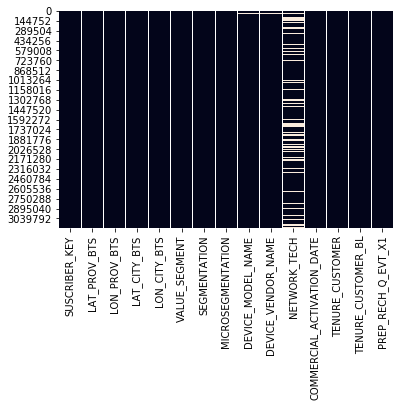

In [44]:
#haremos un heatmap con las primeras 15 columnas identificando donde hay nulos 
#donde vemos mas blancos es que hay mas nulos
sns.heatmap(fulldata[fulldata.columns[0:15]].isnull(), cbar=False)
#vemos asi que network_tech tiene muuuchos nulos 

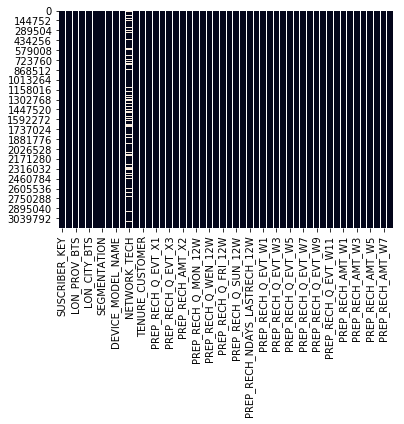

In [45]:
#ahora vmos a hacer lo mismo pero con las primeras 50 columnas
sns.heatmap(fulldata[fulldata.columns[0:50]].isnull(), cbar=False)

In [47]:
#haremos un sample de este fulldata , creo que 0.3 es decir que haremos un sample de la 3er parte
sampledata = fulldata.sample(frac=0.3)

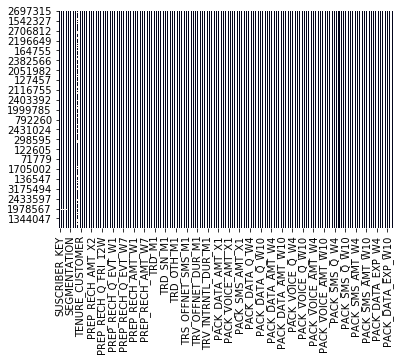

In [48]:
#y de este sample haremos un heatmap para poder visualizar mejor 
sns.heatmap(sampledata.isnull(), cbar=False)

In [49]:
#contaremos la cantidad de nulos para cada columna 
nullcount = {col:fulldata[col].isnull().sum() for col in fulldata.columns}

In [50]:
#y haremos una serie con estos valores apra graficarlo como grafico de barras
missing = pd.Series(nullcount)

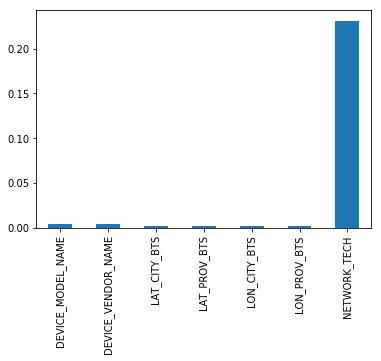

In [51]:
missing[missing>0].div(fulldata.shape[0]).plot.bar()

#### Imputar Network Tech

In [52]:
#como hay muuuchos nulos en network_tech vamos a trabajar con esto 
#sacareos un promedio de sus valores y vemos que la tecnologia que mas hay es LTE
fulldata['NETWORK_TECH'].value_counts(normalize=True,dropna=False)

LTE    0.372894
3G     0.365532
NaN    0.231319
2G     0.030255
Name: NETWORK_TECH, dtype: float64

In [53]:
#entonces apra cada valor nulo existente en network_tech, le asignaremos el valor LTE, esta es una manera de eliminar nulos
fulldata.loc[fulldata['NETWORK_TECH'].isnull(),'NETWORK_TECH']='LTE'

In [54]:
#obtenemos la nueva distribucion luego de asignar LTE
fulldata['NETWORK_TECH'].value_counts(normalize=True)

LTE    0.604213
3G     0.365532
2G     0.030255
Name: NETWORK_TECH, dtype: float64

In [58]:
# device model name - distrucion por modelo
fulldata['DEVICE_MODEL_NAME'].value_counts(normalize=True,dropna=False)

NOT_IDENTIFIED                                  1.131627e-01
GALAXY GRAND PRIME DUOS (SM-G532M DS)           9.450743e-02
GALAXY GRAND NEO (GT-I9060C)                    3.117768e-02
GALAXY J7 DUOS LTE (SM-J700MDS)                 2.807674e-02
GALAXY J2 PRIME (SM-G532M)                      1.933383e-02
Y9 2019 (JKM-LX3)                               1.900474e-02
Y6 2 (CAM-L23)                                  1.725157e-02
Y5 2018 (DRA-LX3)                               1.706159e-02
GALAXY J7 NEO (SM-J701M DS)                     1.462354e-02
GALAXY J1 ACE (SM-J106B DL)                     1.407935e-02
JENNY TV 2.8                                    1.392046e-02
GALAXY J7 PRIME (SM-G610M DS)                   1.375026e-02
GALAXY J5 (SM-J500M)                            1.314923e-02
GALAXY J1 (SM-J111MDS)                          1.308925e-02
P20 LITE (ANE-LX3)                              1.271776e-02
Y5 2017 (MYA-L23)                               1.251365e-02
GALAXY J5 DUOS (SM-J500M

In [59]:
# device brand
fulldata['DEVICE_VENDOR_NAME'].value_counts(normalize=True,dropna=False)

SAMSUNG            5.255461e-01
HUAWEI             1.733811e-01
NOT_IDENTIFIED     1.131627e-01
LG                 5.277024e-02
NOKIA              3.629619e-02
BLU                2.800891e-02
APPLE              1.842412e-02
UNKNOWN            7.862404e-03
ALCATEL            6.592198e-03
GREYMARKET         5.023046e-03
HYUNDAI            4.416047e-03
AZUMI              4.210679e-03
SIEMENS            2.846895e-03
BLACKBERRY         1.716113e-03
TELEONE            1.524562e-03
SONYERICSSON       1.428158e-03
CAT                1.388905e-03
ZTE                1.121361e-03
MOTOROLA           1.016165e-03
TELEGO             9.919856e-04
SONY               9.213314e-04
LANIX              8.214734e-04
CATERPILLAR        5.614657e-04
YXTEL              5.127928e-04
OMES               4.904975e-04
ADMET              4.179591e-04
DAEWOO             3.896974e-04
TECNO              3.812189e-04
J-MAX              3.787068e-04
HTC                3.746245e-04
                       ...     
BASICOM 

In [60]:
#los valores que son nulos los completo con NOT IDENTIFIED - Model y Vendor
fulldata.loc[fulldata['DEVICE_MODEL_NAME'].isnull(),'DEVICE_MODEL_NAME']='NOT_IDENTIFIED'
fulldata.loc[fulldata['DEVICE_VENDOR_NAME'].isnull(),'DEVICE_VENDOR_NAME']='NOT_IDENTIFIED'

In [62]:
#Latitud de Provincia distribucion dropna: include counts of NaN.
fulldata['LAT_PROV_BTS'].value_counts(normalize=True,dropna=False)

9.08320    0.397844
8.79528    0.129748
8.58480    0.116336
9.18520    0.087756
8.62660    0.087368
8.12310    0.051085
7.59090    0.048393
9.41650    0.032757
7.77040    0.031650
7.86810    0.012319
8.65950    0.001828
9.23440    0.001505
NaN        0.001411
Name: LAT_PROV_BTS, dtype: float64

In [65]:
fulldata.shape

(3184522, 190)

In [66]:
#aca se fija cuantos NaN hay 
fulldata.dropna().shape

(3180029, 190)

In [68]:
#aca obtiene el numero de filas y columnos not null por LAT_PROV
fulldata[fulldata['LAT_PROV_BTS'].notnull()].shape


,SUSCRIBER_KEY,LAT_PROV_BTS,LON_PROV_BTS,LAT_CITY_BTS,LON_CITY_BTS,VALUE_SEGMENT,SEGMENTATION,MICROSEGMENTATION,DEVICE_MODEL_NAME,DEVICE_VENDOR_NAME,...,PACK_DATA_EXP_W4,PACK_DATA_EXP_W5,PACK_DATA_EXP_W6,PACK_DATA_EXP_W7,PACK_DATA_EXP_W8,PACK_DATA_EXP_W9,PACK_DATA_EXP_W10,PACK_DATA_EXP_W11,PACK_DATA_EXP_W12,Target
0,3005_20190427,9.4165,-82.5207,-82.52000,9.43000,2 - GOLD,3-DO,VD3,NOT_IDENTIFIED,NOT_IDENTIFIED,...,7,13,11,9,11,12,9,9,0,0
1,4767_20150701,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,...,9,11,11,15,9,13,15,14,13,0
2,4767_20150701,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,...,9,11,11,15,9,13,15,14,13,0
3,4767_20150701,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,...,9,11,11,15,9,13,15,14,13,1
4,4767_20150701,8.5848,-82.3885,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,...,9,11,11,15,9,13,15,14,13,0


### Manejo de Irregulares y Outliers

In [70]:
# obtengo todas las columnas
fulldata.columns.to_list()

['SUSCRIBER_KEY',
 'LAT_PROV_BTS',
 'LON_PROV_BTS',
 'LAT_CITY_BTS',
 'LON_CITY_BTS',
 'VALUE_SEGMENT',
 'SEGMENTATION',
 'MICROSEGMENTATION',
 'DEVICE_MODEL_NAME',
 'DEVICE_VENDOR_NAME',
 'NETWORK_TECH',
 'COMMERCIAL_ACTIVATION_DATE',
 'TENURE_CUSTOMER',
 'TENURE_CUSTOMER_BL',
 'PREP_RECH_Q_EVT_X1',
 'PREP_RECH_Q_EVT_X2',
 'PREP_RECH_Q_EVT_X3',
 'PREP_RECH_AMT_X1',
 'PREP_RECH_AMT_X2',
 'PREP_RECH_AMT_X3',
 'PREP_RECH_Q_MON_12W',
 'PREP_RECH_Q_TUE_12W',
 'PREP_RECH_Q_WEN_12W',
 'PREP_RECH_Q_THUR_12W',
 'PREP_RECH_Q_FRI_12W',
 'PREP_RECH_Q_SAT_12W',
 'PREP_RECH_Q_SUN_12W',
 'PREP_RECH_LAST_DAY_12W',
 'PREP_RECH_NDAYS_LASTRECH_12W',
 'PREP_RECH_CHNNL_MODE12W',
 'PREP_RECH_Q_EVT_W1',
 'PREP_RECH_Q_EVT_W2',
 'PREP_RECH_Q_EVT_W3',
 'PREP_RECH_Q_EVT_W4',
 'PREP_RECH_Q_EVT_W5',
 'PREP_RECH_Q_EVT_W6',
 'PREP_RECH_Q_EVT_W7',
 'PREP_RECH_Q_EVT_W8',
 'PREP_RECH_Q_EVT_W9',
 'PREP_RECH_Q_EVT_W10',
 'PREP_RECH_Q_EVT_W11',
 'PREP_RECH_Q_EVT_W12',
 'PREP_RECH_AMT_W1',
 'PREP_RECH_AMT_W2',
 'PREP_RECH

#### Descripción Estadística

In [71]:
#info trafico mensual de datos
fulldata['TRD_M1'].describe()

count    3.184522e+06
mean     4.796169e+00
std      9.168608e+00
min      0.000000e+00
25%      0.000000e+00
50%      1.060000e+00
75%      5.290000e+00
max      7.642800e+02
Name: TRD_M1, dtype: float64

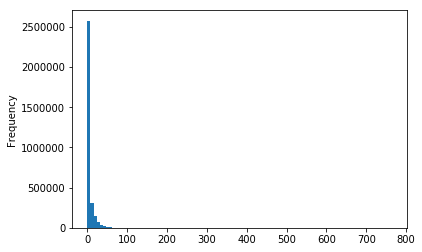

In [72]:
#bins numerical variables 100
fulldata['TRD_M1'].plot.hist(bins=100)

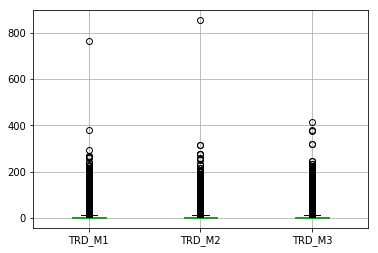

In [73]:
#grafico boxplot para ver el tradifoc mensual de datos y ahi poder localizar los valores irregulares o outliers
fulldata.boxplot(['TRD_M1','TRD_M2','TRD_M3'])

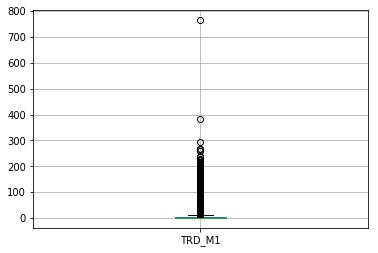

In [74]:
fulldata.boxplot('TRD_M1')

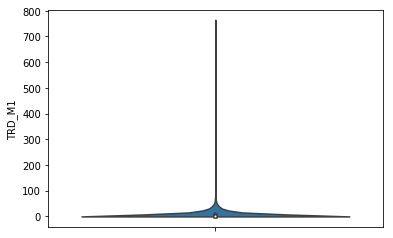

In [75]:
#otro tipo de grafico para ver el trafico mensual de datos 
sns.violinplot(y=fulldata['TRD_M1'])

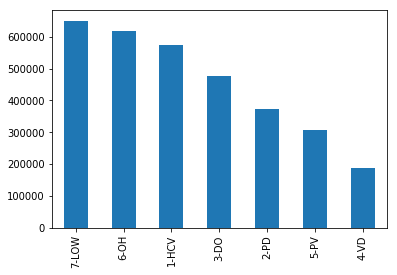

In [78]:
#segmentation 
fulldata['SEGMENTATION'].value_counts().plot.bar()

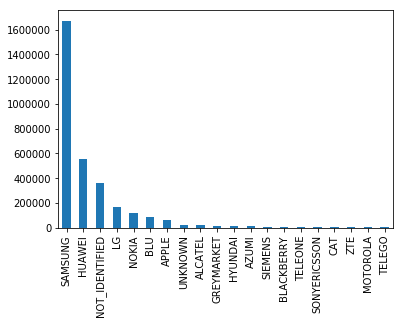

In [80]:
fulldata['DEVICE_VENDOR_NAME'].value_counts()[:20].plot.bar()

### TRATAMIENTO DE OUTLIERS

In [81]:
fulldata.shape

(3184522, 190)

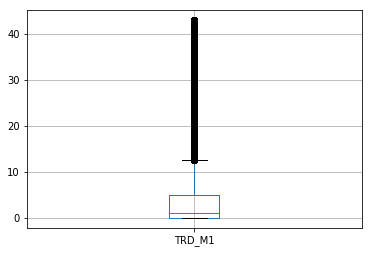

In [82]:
#Eliminando valores muy extremos -toma el 99% DE LOS VALORES 
fulldata[fulldata['TRD_M1']<=fulldata['TRD_M1'].quantile(0.99)].boxplot('TRD_M1')

In [90]:
fulldata[fulldata['TRD_M1']<=fulldata['TRD_M1'].quantile(0.99)].shape

(3184522, 190)

In [91]:
fulldata[fulldata['TRD_M1']>fulldata['TRD_M1'].quantile(0.95)].shape

(0, 190)

In [92]:
fulldata.loc[fulldata['TRD_M1']>fulldata['TRD_M1'].quantile(0.95),'TRD_M1'] = fulldata['TRD_M1'].quantile(0.95)

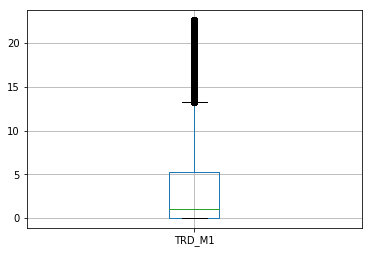

In [93]:
fulldata.boxplot('TRD_M1')

In [94]:
fulldata[fulldata.columns[:20]]

,SUSCRIBER_KEY,LAT_PROV_BTS,LON_PROV_BTS,LAT_CITY_BTS,LON_CITY_BTS,VALUE_SEGMENT,SEGMENTATION,MICROSEGMENTATION,DEVICE_MODEL_NAME,DEVICE_VENDOR_NAME,NETWORK_TECH,COMMERCIAL_ACTIVATION_DATE,TENURE_CUSTOMER,TENURE_CUSTOMER_BL,PREP_RECH_Q_EVT_X1,PREP_RECH_Q_EVT_X2,PREP_RECH_Q_EVT_X3,PREP_RECH_AMT_X1,PREP_RECH_AMT_X2,PREP_RECH_AMT_X3
0,3005_20190427,9.41650,-82.52070,-82.52000,9.43000,2 - GOLD,3-DO,VD3,NOT_IDENTIFIED,NOT_IDENTIFIED,LTE,27-APR-19,6,6,4,5,6,6.0,9.0,17.0
1,4767_20150701,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,LTE,01-JUL-15,52,52,8,8,7,24.0,22.0,25.0
2,4767_20150701,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,LTE,01-JUL-15,52,52,8,8,7,24.0,22.0,25.0
3,4767_20150701,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,LTE,01-JUL-15,52,52,8,8,7,24.0,22.0,25.0
4,4767_20150701,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,LTE,01-JUL-15,52,52,8,8,7,24.0,22.0,25.0
5,4767_20150701,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,LTE,01-JUL-15,52,52,8,8,7,24.0,22.0,25.0
6,4767_20150701,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,LTE,01-JUL-15,52,52,8,8,7,24.0,22.0,25.0
7,4767_20150701,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,LTE,01-JUL-15,52,52,8,8,7,24.0,22.0,25.0
8,4767_20150701,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,LTE,01-JUL-15,52,52,8,8,7,24.0,22.0,25.0
9,4767_20150701,8.58480,-82.38850,-81.82747,8.22436,1 - PLATINUM,1-HCV,HCV1,GALAXY J5 PRIME DUOS (SM-G570M DS),SAMSUNG,LTE,01-JUL-15,52,52,8,8,7,24.0,22.0,25.0


In [95]:
#segmento mira uniques
fulldata['VALUE_SEGMENT'].unique()

array(['2 - GOLD', '1 - PLATINUM', '3 - SILVER', '4 - BRONZE'],
      dtype=object)

In [96]:
#segmentation unique
fulldata['SEGMENTATION'].unique()

array(['3-DO', '1-HCV', '4-VD', '2-PD', '5-PV', '6-OH', '7-LOW'],
      dtype=object)

In [97]:
#microsegmentation
fulldata['MICROSEGMENTATION'].unique()

array(['VD3', 'HCV1', 'PD3', 'DO3', 'PV1', 'PD1', 'DO4', 'OH2', 'PV3',
       'HCV4', 'HCV2', 'HCV3', 'OH3', 'LOW4', 'LOW2', 'PD2', 'OH1', 'OH4',
       'DO1', 'LOW3', 'DO2', 'VD2', 'LOW1', 'VD1', 'PV2'], dtype=object)

In [98]:
#device vendor name
fulldata['DEVICE_VENDOR_NAME'].unique()

array(['NOT_IDENTIFIED', 'SAMSUNG', 'HUAWEI', 'LG', 'NOKIA', 'AZUMI',
       'GREYMARKET', 'YXTEL', 'BLU', 'ALCATEL', 'KALIHO', 'APPLE',
       'UNKNOWN', 'LENOVO', 'SONYERICSSON', 'MOTOROLA', 'TELEGO', 'LANIX',
       'SKY', 'MAXWEST', 'SUPERINWORLD', 'HYUNDAI', 'WASAM', 'SIEMENS',
       'VERYKOOL', 'HTC', 'SANTOK', 'TELEONE', 'ZTE', 'SONY', 'CAT',
       'B.EASY', 'XIAOMI', 'GIONEE', 'INTEX', 'ELITEK', 'YEZZ', 'OMES',
       'ASUS', 'ADMET', 'TECNO', 'DARAGO', 'J-MAX', 'BLACKBERRY', 'ORION',
       'AMGOO', 'SMALT', 'HEDY', 'CELLON', 'CATERPILLAR', 'BMOBILE',
       'HAWAH', 'NEFFOS', 'DDM', 'QUATRO-MOBILE', 'Q7', 'J.C.P',
       'FORTUNESHIP', 'FLY', 'BLACKVIEW', 'VIEWSONIC', 'MEIZU', 'MYTOP',
       'TINMO', 'DAEWOO', 'M.T.T.', 'ANYCOOL', 'GAOXINQI', 'SAGEM',
       'YINGTAI', 'NONY', 'MICROSOFT', 'TINNO', 'SZL', 'HAIER', 'PLUM',
       'OPPO', 'CCIT', 'ICEMOBILE', 'IPRO', 'PHILIPS', 'GRESSO', 'DOOGEE',
       'MYPHONE', 'ARGOMTECH', 'MBO', 'NEWSMY', 'BDBAL', 'SAGETEL',
       'WI

### Transformación de Datos

In [99]:
#observa el tipo de dato de activation date y luego lo convierte a datetime
fulldata['COMMERCIAL_ACTIVATION_DATE'].dtype

dtype('O')

In [100]:
# los pasa a datetime
pd.to_datetime(fulldata['COMMERCIAL_ACTIVATION_DATE'])

0         2019-04-27
1         2015-07-01
2         2015-07-01
3         2015-07-01
4         2015-07-01
5         2015-07-01
6         2015-07-01
7         2015-07-01
8         2015-07-01
9         2015-07-01
10        2015-07-01
11        2015-07-01
12        2015-07-01
13        2015-07-01
14        2015-07-01
15        2015-07-01
16        2015-07-01
17        2015-07-01
18        2015-07-01
19        2015-07-01
20        2015-07-01
21        2015-07-01
22        2015-07-01
23        2015-07-01
24        2015-07-01
25        2015-07-01
26        2015-07-01
27        2015-07-01
28        2015-07-01
29        2015-07-01
             ...    
3184492   2017-12-09
3184493   2017-10-05
3184494   2017-03-20
3184495   2018-01-21
3184496   2015-07-17
3184497   2016-05-31
3184498   2019-04-27
3184499   2016-10-09
3184500   2017-11-29
3184501   2019-02-14
3184502   2016-06-12
3184503   2018-03-03
3184504   2017-06-08
3184505   2017-03-25
3184506   2015-07-14
3184507   2017-07-03
3184508   201

In [101]:
# aca los que hace es poner directamten el segmento 1- GOLD como 1
pd.to_numeric(fulldata['VALUE_SEGMENT'].str.split(' - ').str[0])

0          2
1          1
2          1
3          1
4          1
5          1
6          1
7          1
8          1
9          1
10         1
11         1
12         1
13         1
14         1
15         1
16         1
17         1
18         1
19         2
20         2
21         2
22         2
23         2
24         2
25         2
26         2
27         2
28         2
29         2
          ..
3184492    4
3184493    2
3184494    3
3184495    2
3184496    2
3184497    3
3184498    1
3184499    1
3184500    3
3184501    1
3184502    3
3184503    3
3184504    4
3184505    4
3184506    2
3184507    2
3184508    2
3184509    1
3184510    4
3184511    3
3184512    2
3184513    2
3184514    2
3184515    1
3184516    3
3184517    1
3184518    4
3184519    3
3184520    3
3184521    3
Name: VALUE_SEGMENT, Length: 3184522, dtype: int64

In [103]:
# podemos hacer lo mismo con SEGMENTATION-ANDRE 1-HCV
pd.to_numeric(fulldata['SEGMENTATION'].str.split('-').str[0])

0          3
1          1
2          1
3          1
4          1
5          1
6          1
7          1
8          1
9          1
10         1
11         1
12         1
13         1
14         1
15         1
16         1
17         1
18         1
19         4
20         4
21         4
22         4
23         4
24         4
25         4
26         4
27         4
28         4
29         4
          ..
3184492    7
3184493    1
3184494    7
3184495    3
3184496    5
3184497    6
3184498    2
3184499    5
3184500    7
3184501    1
3184502    7
3184503    7
3184504    7
3184505    7
3184506    5
3184507    6
3184508    3
3184509    1
3184510    7
3184511    6
3184512    1
3184513    1
3184514    1
3184515    1
3184516    6
3184517    2
3184518    7
3184519    2
3184520    7
3184521    6
Name: SEGMENTATION, Length: 3184522, dtype: int64

## Distribución del Dataset

### Univariadas

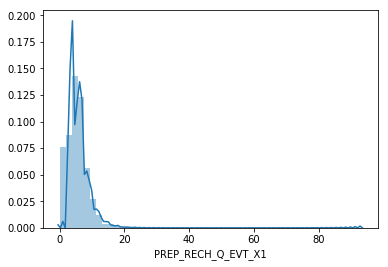

In [102]:
#Cantidad de recargas acumuladas mensuales
sns.distplot(fulldata['PREP_RECH_Q_EVT_X1'])

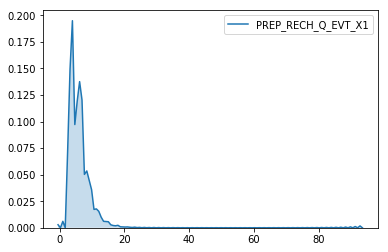

In [104]:
sns.kdeplot(fulldata['PREP_RECH_Q_EVT_X1'],shade=True)

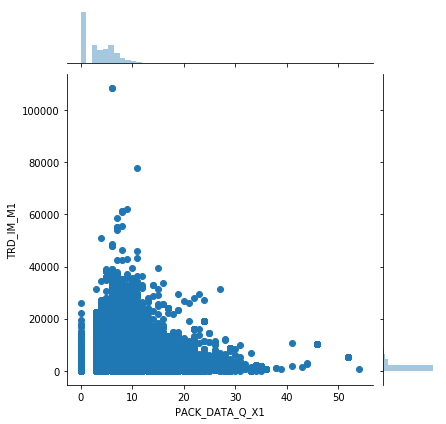

In [105]:
#PACK_DATA_Q_X1 Cantidad de Pack de datos mensuales
#TRD_IM_M1 Tráfico de Datos Mensajes por internet mensual
sns.jointplot(x=fulldata['PACK_DATA_Q_X1'], y=fulldata['TRD_IM_M1'])

In [113]:
fulldata.columns.to_list()

['SUSCRIBER_KEY',
 'LAT_PROV_BTS',
 'LON_PROV_BTS',
 'LAT_CITY_BTS',
 'LON_CITY_BTS',
 'VALUE_SEGMENT',
 'SEGMENTATION',
 'MICROSEGMENTATION',
 'DEVICE_MODEL_NAME',
 'DEVICE_VENDOR_NAME',
 'NETWORK_TECH',
 'COMMERCIAL_ACTIVATION_DATE',
 'TENURE_CUSTOMER',
 'TENURE_CUSTOMER_BL',
 'PREP_RECH_Q_EVT_X1',
 'PREP_RECH_Q_EVT_X2',
 'PREP_RECH_Q_EVT_X3',
 'PREP_RECH_AMT_X1',
 'PREP_RECH_AMT_X2',
 'PREP_RECH_AMT_X3',
 'PREP_RECH_Q_MON_12W',
 'PREP_RECH_Q_TUE_12W',
 'PREP_RECH_Q_WEN_12W',
 'PREP_RECH_Q_THUR_12W',
 'PREP_RECH_Q_FRI_12W',
 'PREP_RECH_Q_SAT_12W',
 'PREP_RECH_Q_SUN_12W',
 'PREP_RECH_LAST_DAY_12W',
 'PREP_RECH_NDAYS_LASTRECH_12W',
 'PREP_RECH_CHNNL_MODE12W',
 'PREP_RECH_Q_EVT_W1',
 'PREP_RECH_Q_EVT_W2',
 'PREP_RECH_Q_EVT_W3',
 'PREP_RECH_Q_EVT_W4',
 'PREP_RECH_Q_EVT_W5',
 'PREP_RECH_Q_EVT_W6',
 'PREP_RECH_Q_EVT_W7',
 'PREP_RECH_Q_EVT_W8',
 'PREP_RECH_Q_EVT_W9',
 'PREP_RECH_Q_EVT_W10',
 'PREP_RECH_Q_EVT_W11',
 'PREP_RECH_Q_EVT_W12',
 'PREP_RECH_AMT_W1',
 'PREP_RECH_AMT_W2',
 'PREP_RECH

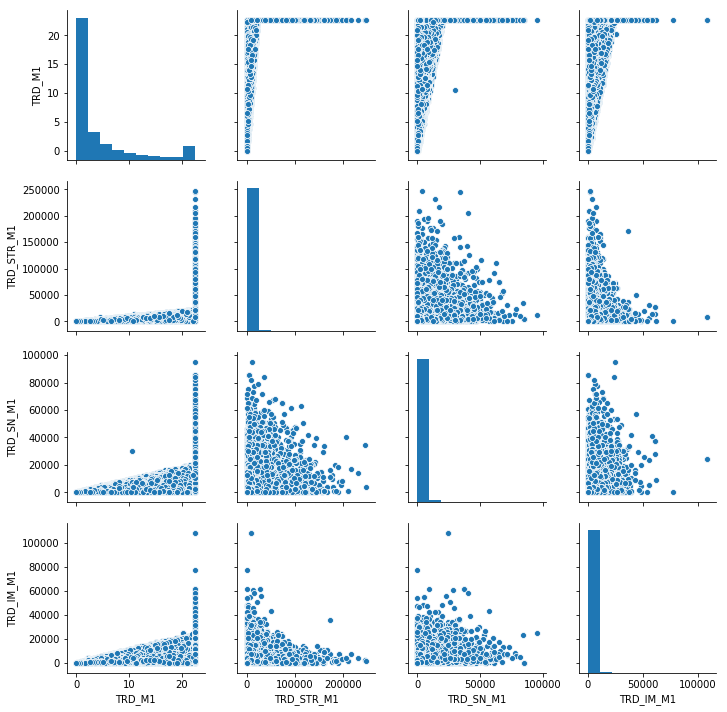

In [114]:
#TRD_M1 Tráfico de Datos Mensual
#TRD_STR_M1 Tráfico de Datos en Streaming Mensual
#TRD_SN_M1 Tráfico de Datos Redes Sociales Mensual
#TRD_IM_M1 Tráfico de Datos Mensajes por internet mensual
sns.pairplot(fulldata[['TRD_M1','TRD_STR_M1','TRD_SN_M1','TRD_IM_M1']])

In [108]:
fulldata[['TRD_M1','TRD_STR_M1','TRD_SN_M1','TRD_IM_M1']].head()

,TRD_M1,TRD_STR_M1,TRD_SN_M1,TRD_IM_M1
0,1.25,18,20,874
1,6.61,1788,310,2350
2,6.61,1788,310,2350
3,6.61,1788,310,2350
4,6.61,1788,310,2350


In [109]:
fulldata[['TRD_STR_M1','TRD_SN_M1','TRD_IM_M1']].div(1024).sum(axis=1)

0           0.890625
1           4.343750
2           4.343750
3           4.343750
4           4.343750
5           4.343750
6           4.343750
7           4.343750
8           4.343750
9           4.343750
10          4.343750
11          4.343750
12          4.343750
13          4.343750
14          4.343750
15          4.343750
16          4.343750
17          4.343750
18          4.343750
19          3.384766
20          3.384766
21          3.384766
22          3.384766
23          3.384766
24          3.384766
25          3.384766
26          3.384766
27          3.384766
28          3.384766
29          3.384766
             ...    
3184492     0.000000
3184493    18.260742
3184494     0.000000
3184495     1.420898
3184496     0.746094
3184497     0.000000
3184498     1.683594
3184499     0.561523
3184500     0.227539
3184501     2.130859
3184502     0.000000
3184503     0.000000
3184504     0.000000
3184505     0.000000
3184506     0.000000
3184507     0.465820
3184508     1

In [110]:
#to find the pairwise correlation for all columns in DF
corr = fulldata.corr()

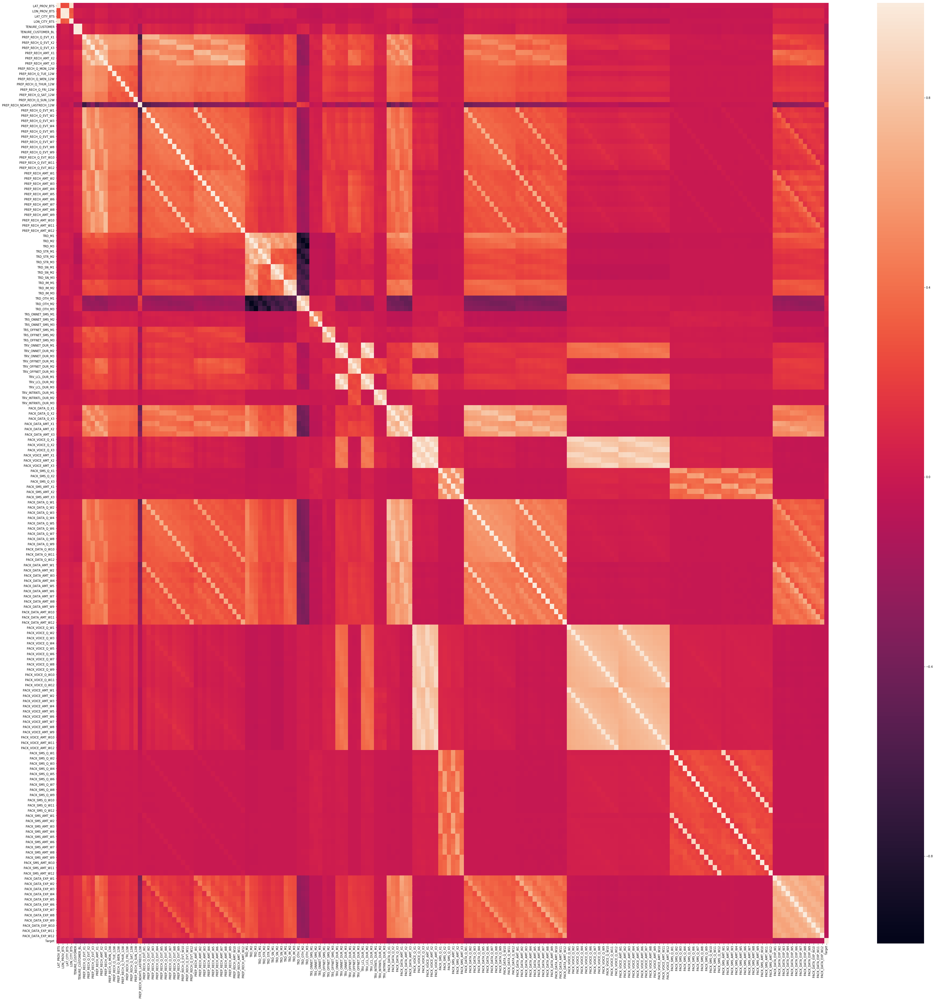

In [111]:
plt.figure(figsize=(60,60))
# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)


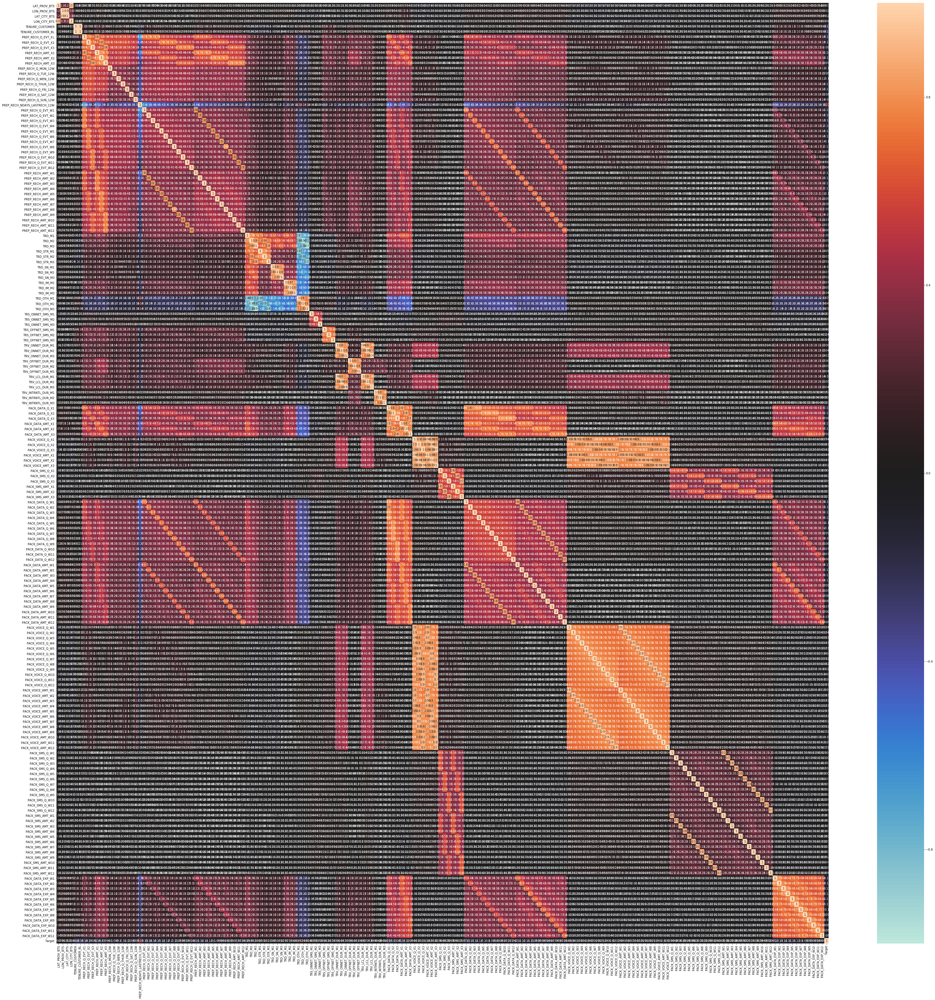

In [112]:
plt.figure(figsize=(60,60))
# plot the heatmap
sns.heatmap(corr, 
        annot = True, vmin=-1, vmax=1, center= 0,
        xticklabels=corr.columns,
        yticklabels=corr.columns)

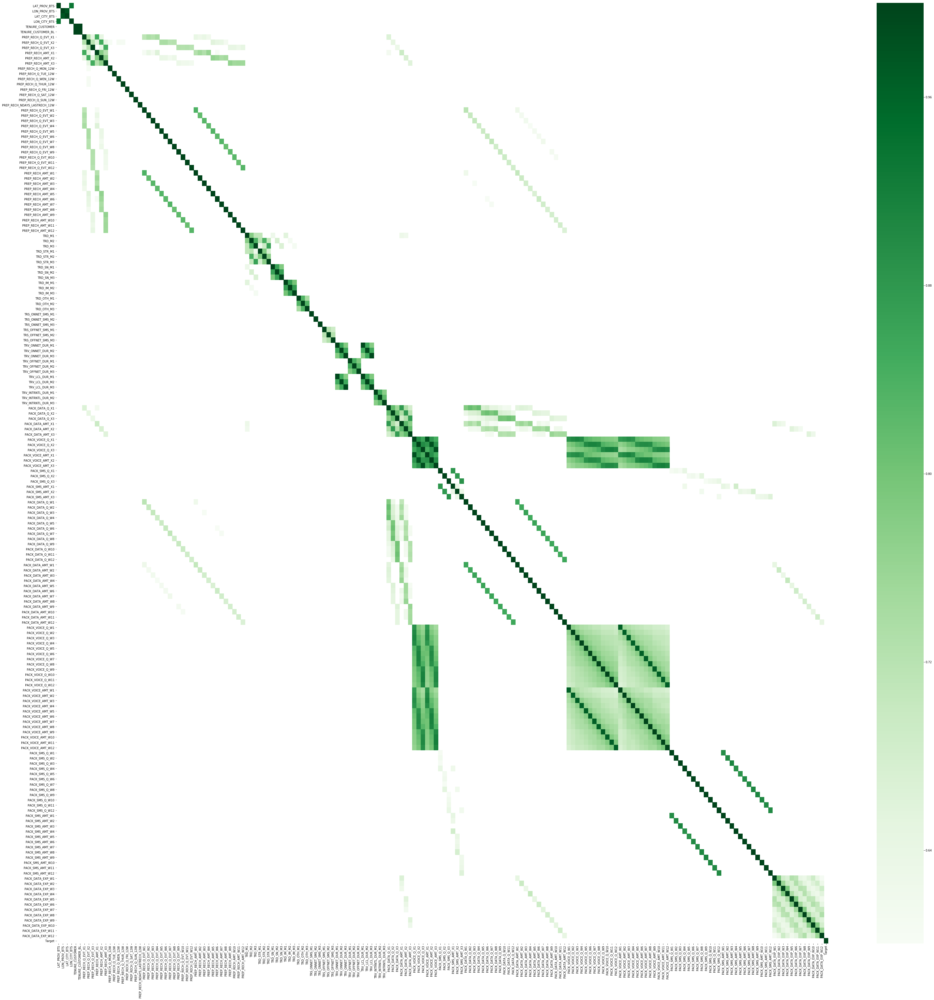

In [115]:
kot = corr[corr>=.6]
plt.figure(figsize=(60,60))
sns_plot = sns.heatmap(kot, cmap="Greens")
sns_plot.figure.savefig("output.png")

In [ ]:
def train(X_train,y_train):
    """
    Función para entrenar el modelo.
    
    Parameters
    -----------
    
    X_train: pd.DataFrame
        Dataset de Train, listo para entrenar y sin tag
        
    y_train: pd.DataFrame
        Dataset de tag, es el tag correspondiente al dataset de train.
        
    Return
    ----------
    Modelo Entrenado.
    
    """
    xgb_model = xgb.XGBClassifier()

    print("Comienza entrenamiento del modelo XGBoost")

    xgb_model.fit(X_train, y_train)

    print("Entrenamiento finalizado\n")

    print("Haciendo las predicciones\n\n")

    XGB_preds = xgb_model.predict(X_test)
    print(classification_report(y_test, XGB_preds))
    print(confusion_matrix(y_test, XGB_preds))
    return xgb_model

In [ ]:
def predict(data_to_predict, xgb_model):
    """Funcion para hacer el entrenamiento del modelo y guardarlo en un archivo .pkl

    Parameters
    -----------

    data_to_predict : pd.DataFrame
        DataFrame listo para predecir, con las mismas transformaciones que el de entrenamiento.
        
    xgb_model : xgb.XGBClassifier
        Modelo entrenado de XGBoost

    Return
    -----------
    Dataframe de 3 columnas, la identificacion del cliente, la prediccion de la clase y la probabilidad de que el cliente
    permanezca en el servicio.


    """
    print("\n\n-------------------------")
    print("Ingreso a la funcion de prediccion\n")

    XGB_preds = xgb_model.predict_proba(X)
    
    return XGB_preds

In [ ]:
modelo = train(X_train, y_train)

In [ ]:
resultado = predict(data,modelo)

In [ ]:
resultado.to_csv('./resultad')